In [1]:
import pandas as pd 
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
from pygam import LinearGAM
from pygam.datasets import mcycle

In [2]:
# read the data 
# merge phenotypic data and imaging data 
nk1 = pd.read_csv('scripts/nkidata/nki_allsubjects_qc.csv')
nk2 = pd.read_csv('scripts/nkidata//gm_wm_summary2.csv')
nk = pd.merge(nk1,nk2,on=["sub","ses"])
nk3 = pd.read_csv('scripts/nkidata/NKI_participants_New.tsv',sep='\t')
nk = pd.merge(nk,nk3,on=["sub","ses"])

gr1 = pd.read_csv('scripts/grympydata/irr_allsubjects_qc.csv')
gr2 = pd.read_csv('scripts/grympydata/gm_wm_summary.csv')
gr = pd.merge(gr1,gr2,on="sub")
gr3=pd.read_csv('scripts/grympydata/demographics.csv')
gr = pd.merge(gr,gr3,on="sub")
#gr4 = pd.read_csv('scripts/grympydata/grmpyALLEligClean.csv')
#gr = pd.merge(gr,gr4,on="sub")

pn1 = pd.read_csv('scripts/pncdata/pnc_allsubjects_qc.csv')
pn2 = pd.read_csv('scripts/pncdata/gm_wm_summary.csv')
pn = pd.merge(pn1,pn2,on="sub")
pn3 = pd.read_csv('scripts/pncdata/pnc_demographic.csv')
pn = pd.merge(pn,pn3,on="sub")

ags1=pd.read_csv('scripts/ageingdata/ageqc_allsubjects_qc.csv')
ags2=pd.read_csv('scripts/ageingdata//gm_wm_summary.csv')
ag=pd.merge(ags1,ags2,on="sub")
ags3 =pd.read_excel('scripts/ageingdata//Book1.xlsx',engine='openpyxl')
ags3.head()

ag = pd.merge(ag,ags3,on="sub")

cd1 = pd.read_csv('scripts/ftddata/ftd_allsubjects_qc.csv')
cd2 = pd.read_csv('scripts/ftddata/gm_wm_summary.csv')
cd3 = pd.read_excel('scripts/ftddata/Updated_LEFFTDS.xlsx',engine='openpyxl')
                  
cd=pd.merge(cd2,cd1,on="sub")
cd=pd.merge(cd,cd3,on="sub")
cd

,sub,CBF_GM,CBF_WM,SCRUB_GM,SCRUB_WM,BASIL_GM,BASIL_WM,PVC_GM,PVC_WM,FD,...,GMmeanCBF,WMmeanCBF,Gm_Wm_CBF_ratio,NEG_CBF_PERC,NEG_SCORE_PERC,NEG_SCRUB_PERC,NEG_BASIL_PERC,NEG_PVC_PERC,sex,age
0,1014,31.727503,26.273416,31.727503,26.273416,32.103377,27.166296,35.452414,29.170616,0,...,31.360523,26.597003,1.179100,0.006888,0.006888,0.006888,0.0,0.0,M,51
1,1285,39.963043,36.691646,39.963043,36.691646,40.779891,37.758725,44.979618,40.549163,0,...,39.954234,36.504868,1.094491,0.000000,0.000000,0.000000,0.0,0.0,M,73
2,1658,29.574654,26.468884,29.574654,26.468884,30.095419,27.203646,33.366794,29.254942,0,...,29.580654,25.586445,1.156106,0.000000,0.000000,0.000000,0.0,0.0,F,70
3,1015,29.710479,26.139008,29.710479,26.139008,30.163700,26.917179,33.391009,28.282514,0,...,30.167170,24.816831,1.215593,0.002453,0.002453,0.002453,0.0,0.0,F,62
4,1286,51.529902,43.128509,51.529902,43.128509,52.423836,44.414610,59.020184,46.858246,0,...,52.282949,41.280959,1.266515,0.000000,0.000000,0.000000,0.0,0.0,F,48
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
105,1629,38.113740,35.561059,38.113740,35.561059,38.778863,36.433232,43.011111,40.062856,0,...,39.118568,35.047058,1.116173,0.003377,0.003377,0.003377,0.0,0.0,M,45
106,1283,44.233393,38.338458,44.233393,38.338458,45.039386,39.415986,51.066170,41.807567,0,...,44.472751,37.465554,1.187030,0.028441,0.028441,0.028441,0.0,0.0,M,36
107,1648,33.105514,28.670612,33.105514,28.670612,33.727200,29.454572,37.284451,31.929609,0,...,33.120990,28.314620,1.169749,0.006988,0.006988,0.006988,0.0,0.0,M,62
108,1284,38.039622,30.941686,38.039622,30.941686,38.248497,31.809737,43.911592,32.860055,0,...,39.208208,29.347713,1.335989,0.009804,0.009804,0.009804,0.0,0.0,M,38


In [3]:
# Gm_Wm_CBF_ratio and FD
nkt=nk.shape[0]; nk = nk[(nk['GMmeanCBF'] > 5) & (nk['FD'] < 1) ]; nka = nk.shape[0]
grt=gr.shape[0]; gr = gr[(gr['GMmeanCBF'] > 5) & (gr['FD'] < 1) ]; gra = gr.shape[0]
pnt=pn.shape[0]; pn = pn[(pn['GMmeanCBF'] > 5) & (pn['FD'] < 1) ]; pna = pn.shape[0]
agt=ag.shape[0]; ag = ag[(ag['GMmeanCBF'] > 5) & (ag['FD'] < 1) ]; aga = ag.shape[0]
cdt=cd.shape[0]; cd = cd[(cd['GMmeanCBF'] > 5) & (cd['FD'] < 1) ]; cda = cd.shape[0]

print('Total number of subjects run completely : NK:' +str(nkt) + ' PNC:' +str(pnt) + ' IRR:'+str(grt)+ ' FTD:' 
       +str(cdt)+ ' AGE:' +str(agt))

print('Total number of subjects with CBF less than 10 : NK:' +str(nka) + ' PNC:' +str(pna) + ' IRR:'+str(gra)+ ' FTD:' 
       +str(cda)+ ' AGE:' +str(aga))

Total number of subjects run completely : NK:1691 PNC:1714 IRR:217 FTD:110 AGE:63
Total number of subjects with CBF less than 10 : NK:1568 PNC:1672 IRR:214 FTD:110 AGE:63


In [4]:
# generate best subjects
agx = ag[ag['CBF_GM']>10]
np.savetxt('AGE_list.txt',agx['sub'].to_numpy(),fmt='%1.0f')
grx = gr[gr['CBF_GM']>10]

np.savetxt('IRR_list.txt',grx['sub'].to_numpy(),fmt='%1.0f')
nkx = nk[nk['CBF_GM']>10]
dd = nkx[['sub','ses']]
dd.to_csv('NKI_list.txt',index=None)
pnx = pn[pn['CBF_GM']>10]
np.savetxt('PNC_list.txt',pnx['sub'].to_numpy(),fmt='%1.0f')
cdx = cd[cd['CBF_GM']>10]
np.savetxt('FTD_list.txt',cdx['sub'].to_numpy(),fmt='%1.0f')

In [5]:
nkx[['sub','ses']].to_numpy()
nkx.shape

(1566, 36)

In [6]:
# number of females,
nkf = nk[nk['gender']=="F"].shape[0]
pnf = pn[pn['sex']==2].shape[0]
grf = gr[gr['sex']==2].shape[0]
agf = ag[ag['Gender']=="F"].shape[0]
cdf = cd[cd['sex']=="F"].shape[0]

print('Number of females : NK:' +str(nkf) + ' PNC:' +str(pnf) + ' IRR:'+str(grf)+ ' FTD:' 
       +str(cdf)+ ' AGE:' +str(agf))

print("Total females: "+ str(nkf+pnf+grf+cdf+agf))



Number of females : NK:921 PNC:873 IRR:134 FTD:52 AGE:35
Total females: 2015


In [7]:
allage=np.concatenate((np.array(cd.age),np.array(pn.age),np.array(nk.age),np.array(ag.age),np.array(gr.age)))
allage = allage[~np.isnan(allage)]
len(allage),np.nanmean(allage),np.nanstd(allage)

(3616, 27.012191187328817, 19.687276106976576)

In [21]:
# combine all the data and label with common names 
agdata1 = pd.DataFrame({'sub':ag['sub'],'Datasets': np.repeat('AGE',len(ag)),'CBF GM': ag['CBF_GM'],'CBF WM': ag['CBF_WM'],'CBFTYPE':'SCBF','QEI': ag['cbfQEI'], 
                         'NEG_CBF':ag["NEG_CBF_PERC"],'FD':ag['FD'],'AGE':ag['age'],'CBF_R': ag['CBF_GM']/ag['CBF_WM']})

agdata3 = pd.DataFrame({'sub':ag['sub'],'Datasets': np.repeat('AGE',len(ag)),'CBF GM': ag['SCRUB_GM'], 'CBF WM': ag['SCRUB_WM'],'CBFTYPE':'SCRUB','QEI': ag['scrubQEI'],
                       'NEG_CBF':ag["NEG_SCRUB_PERC"],'FD':ag['FD'],'AGE':ag['age'],'CBF_R':ag['SCRUB_GM']/ag['SCRUB_WM']})
agdata4 = pd.DataFrame({'sub':ag['sub'],'Datasets': np.repeat('AGE',len(ag)),'CBF GM': ag['BASIL_GM'],'CBF WM': ag['BASIL_WM'],'CBFTYPE':'BASIL','QEI': ag['basilQEI'],'FD':ag['FD'],
                      'NEG_CBF':ag["NEG_BASIL_PERC"],'AGE':ag['age'],'CBF_R':ag['BASIL_GM']/ag['BASIL_WM']})
agdata5 = pd.DataFrame({'sub':ag['sub'],'Datasets': np.repeat('AGE',len(ag)),'CBF GM': ag['PVC_GM'],'CBF WM': ag['PVC_WM'],'CBFTYPE':'PVC','QEI': ag['pvcQEI'],'FD':ag['FD'],
                       'NEG_CBF':ag["NEG_PVC_PERC"],'AGE':ag['age'],'CBF_R':ag['PVC_GM']/ag['PVC_WM']})


agdata= pd.concat([agdata1,agdata3,agdata4,agdata5])


cddata1 = pd.DataFrame({'sub':cd['sub'],'Datasets': np.repeat('FTD',len(cd)),'CBF GM': cd['CBF_GM'],'CBF WM': cd['CBF_WM'],'CBFTYPE':'SCBF','QEI': cd['cbfQEI'],'AGE':cd['age'],
                        'NEG_CBF':cd["NEG_CBF_PERC"],'FD':cd['FD'], 'CBF_R':cd['CBF_GM']/cd['CBF_WM']})
cddata4 = pd.DataFrame({'sub':cd['sub'],'Datasets': np.repeat('FTD',len(cd)), 'CBF GM': cd['BASIL_GM'], 'CBF WM': cd['BASIL_WM'],'AGE':cd['age'],'CBFTYPE':'BASIL','QEI': cd['basilQEI'],'FD':cd['FD'],
                       'CBF_R':cd['BASIL_GM']/cd['BASIL_WM']})
cddata5 = pd.DataFrame({'sub':cd['sub'],'Datasets': np.repeat('FTD',len(cd)),'CBF GM': cd['PVC_GM'],'CBF WM': cd['PVC_WM'],'CBFTYPE':'PVC','AGE':cd['age'],'QEI': cd['pvcQEI'],'FD':cd['FD'],
                       'CBF_R':cd['PVC_GM']/cd['PVC_WM']})

cddata= pd.concat([cddata1,cddata4,cddata5])
cddata['NEG_CBF'] = cddata['NEG_CBF'].fillna(0)

grdata1 = pd.DataFrame({'sub':gr['sub'],'Datasets': np.repeat('IRR',len(gr)),'CBF GM': gr['CBF_GM'],'CBF WM': gr['CBF_WM'],'CBFTYPE':'SCBF','QEI': gr['cbfQEI'],
                        'NEG_CBF':gr["NEG_CBF_PERC"],'FD': gr['FD'],'AGE':gr['age'],'CBF_R':gr['CBF_GM']/gr['CBF_WM']})

grdata3 = pd.DataFrame({'sub':gr['sub'],'Datasets': np.repeat('IRR',len(gr)),'CBF GM': gr['SCRUB_GM'],'CBF WM': gr['SCRUB_WM'],'CBFTYPE':'SCRUB','QEI': gr['scrubQEI'],
                       'NEG_CBF':gr["NEG_SCRUB_PERC"],'FD': gr['FD'],'AGE':gr['age'],'CBF_R':gr['SCRUB_GM']/gr['SCRUB_WM']})
grdata4 = pd.DataFrame({'sub':gr['sub'],'Datasets': np.repeat('IRR',len(gr)),'CBF GM': gr['BASIL_GM'],'CBF WM': gr['BASIL_WM'],'CBFTYPE':'BASIL','QEI': gr['basilQEI'],'FD': gr['FD'],
                        'NEG_CBF':gr["NEG_BASIL_PERC"],'AGE':gr['age'],'CBF_R':gr['BASIL_GM']/gr['BASIL_WM']})
grdata5 = pd.DataFrame({'sub':gr['sub'],'Datasets': np.repeat('IRR',len(gr)),'CBF GM': gr['PVC_GM'],'CBF WM': gr['PVC_WM'],'CBFTYPE':'PVC','QEI': gr['pvcQEI'],'FD': gr['FD'],
                        'NEG_CBF':gr["NEG_PVC_PERC"],'AGE':gr['age'],'CBF_R':gr['PVC_GM']/gr['PVC_WM']})


grdata= pd.concat([grdata1,grdata3,grdata4,grdata5])


pndata1 = pd.DataFrame({'sub':pn['sub'],'Datasets': np.repeat('PNC',len(pn)),'CBF GM': pn['CBF_GM'],'CBF WM': pn['CBF_WM'],'CBFTYPE':'SCBF','QEI': pn['cbfQEI'],
                       'NEG_CBF':pn["NEG_CBF_PERC"],'FD': pn['FD'],'AGE':pn['age'],'CBF_R':pn['CBF_GM']/pn['CBF_WM']})
pndata3 = pd.DataFrame({'sub':pn['sub'],'Datasets': np.repeat('PNC',len(pn)),'CBF GM': pn['SCRUB_GM'], 'CBF WM': pn['SCRUB_WM'],'CBFTYPE':'SCRUB','QEI': pn['scrubQEI'],
                       'NEG_CBF':pn["NEG_SCRUB_PERC"],'FD': pn['FD'],'AGE':pn['age'],'CBF_R':pn['SCRUB_GM']/pn['SCRUB_WM']})
pndata4 = pd.DataFrame({'sub':pn['sub'],'Datasets': np.repeat('PNC',len(pn)),'CBF GM': pn['BASIL_GM'],'CBF WM': pn['BASIL_WM'],'CBFTYPE':'BASIL','QEI': pn['basilQEI'],'FD': pn['FD'],
                       'NEG_CBF':pn["NEG_BASIL_PERC"],'AGE':pn['age'],'CBF_R':pn['BASIL_GM']/pn['BASIL_WM']})
pndata5 = pd.DataFrame({'sub':pn['sub'],'Datasets': np.repeat('PNC',len(pn)),'CBF GM': pn['PVC_GM'],'CBF WM': pn['PVC_WM'],'CBFTYPE':'PVC','QEI': pn['pvcQEI'],'FD': pn['FD'],
                       'NEG_CBF':pn["NEG_PVC_PERC"],'AGE':pn['age'],'CBF_R':pn['PVC_GM']/pn['PVC_WM']})

pndata= pd.concat([pndata1,pndata3,pndata4,pndata5])

nkdata1 = pd.DataFrame({'sub':nk['sub']+nk['ses'],'Datasets': np.repeat('NKI',len(nk)),'CBF GM': nk['CBF_GM'], 'CBF WM': nk['CBF_WM'],'CBFTYPE':'SCBF','QEI': nk['cbfQEI'],
                       'NEG_CBF':nk["NEG_CBF_PERC"],'FD': nk['FD'],'AGE':nk['age'],'CBF_R':nk['CBF_GM']/nk['CBF_WM']})
nkdata3 = pd.DataFrame({'sub':nk['sub']+nk['ses'],'Datasets': np.repeat('NKI',len(nk)),'CBF GM': nk['SCRUB_GM'],'CBF WM': nk['SCRUB_WM'],'CBFTYPE':'SCRUB','QEI': nk['scrubQEI'],
                       'NEG_CBF':nk["NEG_SCRUB_PERC"],'FD': nk['FD'],'AGE':nk['age'],'CBF_R':nk['SCRUB_GM']/nk['SCRUB_WM']})
nkdata4 = pd.DataFrame({'sub':nk['sub']+nk['ses'],'Datasets': np.repeat('NKI',len(nk)),'CBF GM': nk['BASIL_GM'],'CBF WM': nk['BASIL_WM'],'CBFTYPE':'BASIL','QEI': nk['basilQEI'],'FD': nk['FD'],
                       'NEG_CBF':nk["NEG_BASIL_PERC"],'AGE':nk['age'],'CBF_R':nk['BASIL_GM']/nk['BASIL_WM']})
nkdata5 = pd.DataFrame({'sub':nk['sub']+nk['ses'],'Datasets': np.repeat('NKI',len(nk)),'CBF GM': nk['PVC_GM'],'CBF WM': nk['PVC_WM'],'CBFTYPE':'PVC','QEI': nk['pvcQEI'],'FD': nk['FD'],
                       'NEG_CBF':nk["NEG_PVC_PERC"],'AGE':nk['age'],'CBF_R':nk['PVC_GM']/nk['PVC_WM']})

nkdata= pd.concat([nkdata1,nkdata3,nkdata4,nkdata5])

gmdata = pd.concat([pndata,nkdata,grdata,cddata,agdata])

In [13]:
grdata.shape[0]/4

214.0

In [22]:
#gmdata = gmdata.fillna(0)
gmdata.to_csv('gmdata2.csv',index=False,sep=',')


In [50]:
dd = gmdata [gmdata['Datasets']=='FTD']
dd1 = dd [dd['CBF TYPE']== 'BASIL']
dd1.dtypes

Datasets     object
CBF GM      float64
CBF WM      float64
CBF TYPE     object
QEI         float64
NEG_CBF     float64
FD          float64
AGE         float64
CBF_R       float64
dtype: object

In [15]:
d= nk['sub']+nk['ses']
d

0        A00034350TRT
1       A00034350FLU1
2        A00063003TRT
3       A00063003BAS1
4       A00063003FLU1
            ...      
1685    A00065975BAS1
1686    A00065975FLU2
1687    A00065975FLU1
1689    A00058516BAS1
1690    A00061727BAS1
Length: 1568, dtype: object

In [18]:
gmdatax = gmdata[(gmdata['CBF_R'] > 1)  &(gmdata['CBFTYPE']  == 'SCBF')]
gmdatax = gmdatax[gmdatax['CBF GM'] > 10]
gmdatax = gmdatax[gmdatax['CBF GM'] < 140]
#gmdatax = gmdatax.dropna()
nkx = gmdatax [(gmdatax['Datasets']=='NKI') & (gmdatax['CBFTYPE']=='SCBF')].shape[0]
pnx = gmdatax [(gmdatax['Datasets']=='PNC') & (gmdatax['CBFTYPE']=='SCBF')].shape[0]
grx = gmdatax [(gmdatax['Datasets']=='IRR') & (gmdatax['CBFTYPE']=='SCBF')].shape[0]
cdx = gmdatax [(gmdatax['Datasets']=='FTD') & (gmdatax['CBFTYPE']=='SCBF')].shape[0]
agx = gmdatax [(gmdatax['Datasets']=='AGE') & (gmdatax['CBFTYPE']=='SCBF')].shape[0]

print('Total number of subjects CBF (GM/WM) > 1 : NK:' +str(nkx) + ' PNC:' +str(pnx) + ' IRR:'+str(grx)+ ' FTD:' 
       +str(cdx)+ ' AGE:' +str(agx))

Total number of subjects CBF (GM/WM) > 1 : NK:1561 PNC:1669 IRR:200 FTD:109 AGE:63


In [25]:
gmdatax.to_csv('gmdata2.csv',index=False,sep=',')

In [21]:
agxy = gmdatax [(gmdatax['Datasets']=='AGE') & (gmdatax['CBF TYPE']=='CBF')]
agxy

,Datasets,CBF GM,CBF WM,CBF TYPE,QEI,NEG_CBF,FD,AGE,CBF_R
0,AGE,21.119342,15.968236,CBF,0.658722,2.913753,0.486803,70.0,1.322585
1,AGE,41.771487,34.127838,CBF,0.762567,0.654940,0.136055,25.0,1.223971
2,AGE,37.967488,31.109719,CBF,0.775029,0.310219,0.175958,23.0,1.220438
3,AGE,72.468403,61.168130,CBF,0.757962,0.481214,0.168183,26.0,1.184741
4,AGE,46.582548,37.525568,CBF,0.780645,0.274323,0.238365,23.0,1.241355
...,...,...,...,...,...,...,...,...,...
58,AGE,59.413105,51.709384,CBF,0.742789,0.470929,0.208559,23.0,1.148981
59,AGE,28.164954,23.392935,CBF,0.753557,0.976245,0.156373,70.0,1.203994
60,AGE,17.999697,14.164845,CBF,0.648389,3.597651,0.183529,75.0,1.270730
61,AGE,67.308209,54.053991,CBF,0.789427,0.146229,0.193616,19.0,1.245203


In [22]:

import warnings
warnings.filterwarnings("ignore")
gdata=gmdatax[gmdatax['CBF TYPE']=='CBF']
gdata=gdata.fillna(0) 
fig, axs = plt.subplots(1,2, sharex=False, sharey=True,dpi=800,figsize=(10,5))
X=np.array(gdata['AGE'])
X=np.reshape(X,(len(X),1))
y=gdata['CBF GM']
gam = LinearGAM(n_splines=4).gridsearch(X, y)
XX = gam.generate_X_grid(term=0, n=14590)
sns.scatterplot(data=gdata, x="AGE", y="CBF GM", hue="Datasets",ax=axs[1])

axs[1].plot(XX, gam.predict(XX), 'k',linewidth=4)
axs[1].plot(XX, gam.prediction_intervals(XX, width=.95), color='k', ls='--')
y_int = gam.prediction_intervals(XX, width=.95)
axs[1].fill_between(XX.ravel(), y_int[:, 0], y_int[:, 1], alpha=0.1, facecolor='k')
sns.despine(top=True, right=True, left=False, bottom=False)
#bx.set_title(til,fontsize=20);


axs[0].set_ylabel('CBF (mL/100 g/min)',fontsize=10)
axs[1].set_xlabel('Age (Years)',fontsize=10)
axs[1].set_ylim(ymin=0,ymax=150)
axs[1].set_xlim(xmin=5,xmax=85)
axs[1].tick_params(labelsize=10)


gda1=gmdatax[['CBF TYPE','CBF GM','Datasets']]
gda2=gmdatax[['CBF TYPE','CBF WM','Datasets']]

gda1['CBF']=gda1['CBF GM']
gda2['CBF']=gda2['CBF WM']
gda1['Tissue Type']=np.repeat('GM',len(gda1))
gda2['Tissue Type']=np.repeat('WM',len(gda2))
gddx=pd.concat([gda1, gda2])
gdx=gddx[gddx['CBF TYPE']=='CBF']
sns.violinplot(x="Datasets", y='CBF', hue='Tissue Type',data=gdx,ax=axs[0],scale='width',x_jitter=.2, scatter_kws={"s": 50,'alpha':0.5})
#bb.axes.set_title("Title",fontsize=50)
axs[0].set_xlabel('',fontsize=20)
axs[0].set_ylabel('CBF (mL/100 g/min)',fontsize=10)
axs[0].tick_params(labelsize=10)
axs[0].set_ylim(ymin=0,ymax=150)
axs[0].legend(title='Tissue', loc='upper right', labels=['GM', 'WM'])
axs[0].legend(fontsize='10', title_fontsize='10')
sns.despine(top=True, right=True, left=False, bottom=False)
axs[0].set_xticklabels(labels=['PNC','NKI','IRR','FTD','AGE'],rotation=30)
#ax.get_legend().remove()
plt.savefig('Figure2.png', dpi=800)

100% (11 of 11) |########################| Elapsed Time: 0:00:01 Time:  0:00:01


In [9]:
gam.summary()

LinearGAM                                                                                                 
=============================================== ==========================================================
Distribution:                        NormalDist Effective DoF:                                      3.9459
Link Function:                     IdentityLink Log Likelihood:                                -18967.6037
Number of Samples:                         3053 AIC:                                            37945.0991
                                                AICc:                                           37945.1184
                                                GCV:                                               199.069
                                                Scale:                                             198.606
                                                Pseudo R-Squared:                                   0.4806
Feature Function                  Lam

In [10]:

#gmdatax = gmdata[(gmdata['CBF_R'] > 1)  &(gmdata['CBF TYPE']  == 'CBF')]
gmdatax = gmdata[gmdata['CBF GM'] > 10]
fig, axs = plt.subplots(1, 3, sharex=True, sharey=True,dpi=800,figsize=(20,8))

gdata=gmdatax[gmdatax['CBF TYPE']=='BASIL']
gdata=gdata.fillna(0) 

X=np.array(gdata['AGE'])
X=np.reshape(X,(len(X),1))
y=gdata['CBF GM']

gam = LinearGAM(n_splines=4).gridsearch(X, y)
XX = gam.generate_X_grid(term=0, n=14590)
sns.scatterplot(data=gdata, x="AGE", y="CBF GM", hue="Datasets",ax=axs[0])
axs[0].plot(XX, gam.predict(XX), 'k',linewidth=4)
axs[0].plot(XX, gam.prediction_intervals(XX, width=.95), color='k', ls='--')
y_int = gam.prediction_intervals(XX, width=.95)
axs[0].legend(fontsize='20', title_fontsize='20')
axs[0].fill_between(XX.ravel(), y_int[:, 0], y_int[:, 1], alpha=0.1, facecolor='k')
sns.despine(top=True, right=True, left=False, bottom=False)
axs[0].set_ylabel('CBF (mL/100 g/min)',fontsize=30)
axs[0].set_xlabel('Age (Years)',fontsize=30)
axs[0].set_ylim(ymin=0,ymax=150)
axs[0].set_xlim(xmin=5,xmax=85)
axs[0].tick_params(labelsize=30)
axs[0].set_title('BASIL',fontsize=30)
gam.summary()



## PVC
gdata=gmdatax[gmdatax['CBF TYPE']=='PVC']
gdata=gdata.fillna(0) 
X=np.array(gdata['AGE'])
X=np.reshape(X,(len(X),1))
y=gdata['CBF GM']
gam = LinearGAM(n_splines=4).gridsearch(X, y)
XX = gam.generate_X_grid(term=0, n=14590)
sns.scatterplot(data=gdata, x="AGE", y="CBF GM", hue="Datasets",ax=axs[1])
axs[1].plot(XX, gam.predict(XX), 'k',linewidth=4)
axs[1].plot(XX, gam.prediction_intervals(XX, width=.95), color='k', ls='--')
y_int = gam.prediction_intervals(XX, width=.95)
axs[1].legend(fontsize='10', title_fontsize='10')
axs[1].fill_between(XX.ravel(), y_int[:, 0], y_int[:, 1], alpha=0.1, facecolor='k')
sns.despine(top=True, right=True, left=False, bottom=False)
axs[1].set_ylabel('',fontsize=30)
axs[1].set_xlabel('Age (Years)',fontsize=30)
axs[1].set_ylim(ymin=0,ymax=150)
axs[1].set_xlim(xmin=5,xmax=85)
axs[1].tick_params(labelsize=30)
axs[1].set_title('BASIL + PVC',fontsize=30)
gam.summary() 


## SCRUB
gdata1=gmdatax[gmdatax['CBF TYPE']=='SCRUB']
gdata=gdata1.fillna(0) 

X=np.array(gdata['AGE'])
X=np.reshape(X,(len(X),1))
y=gdata['CBF GM']

gam = LinearGAM(n_splines=4).gridsearch(X, y)
XX = gam.generate_X_grid(term=0, n=14590)
sns.scatterplot(data=gdata, x="AGE", y="CBF GM", hue="Datasets",ax=axs[2])
axs[2].plot(XX, gam.predict(XX), 'k',linewidth=4)
axs[2].plot(XX, gam.prediction_intervals(XX, width=.95), color='k', ls='--')
y_int = gam.prediction_intervals(XX, width=.95)
axs[2].legend(fontsize='30', title_fontsize='30')
axs[2].fill_between(XX.ravel(), y_int[:, 0], y_int[:, 1], alpha=0.1, facecolor='k')
sns.despine(top=True, right=True, left=False, bottom=False)
axs[2].set_ylabel('',fontsize=30)
axs[2].set_xlabel('Age (Years)',fontsize=30)
axs[2].set_ylim(ymin=0,ymax=150)
axs[2].set_xlim(xmin=5,xmax=85)
axs[2].tick_params(labelsize=30)
axs[2].set_title('SCRUB',fontsize=30)

axs[1].get_legend().remove()
axs[2].get_legend().remove()
#axs[1,1].get_legend().remove()
gam.summary()

plt.savefig('supfigure5.png', dpi=800)

100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00

LinearGAM                                                                                                 
=============================================== ==========================================================
Distribution:                        NormalDist Effective DoF:                                      3.9481
Link Function:                     IdentityLink Log Likelihood:                                -18498.8746
Number of Samples:                         3071 AIC:                                            37007.6455
                                                AICc:                                           37007.6647
                                                GCV:                                              164.6906
                                                Scale:                                            164.3096
                                                Pseudo R-Squared:                                    0.418
Feature Function                  Lam

100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00

LinearGAM                                                                                                 
=============================================== ==========================================================
Distribution:                        NormalDist Effective DoF:                                      3.9481
Link Function:                     IdentityLink Log Likelihood:                                -19528.6428
Number of Samples:                         3071 AIC:                                            39067.1817
                                                AICc:                                           39067.2009
                                                GCV:                                              230.5013
                                                Scale:                                             229.968
                                                Pseudo R-Squared:                                   0.4724
Feature Function                  Lam

100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00


LinearGAM                                                                                                 
=============================================== ==========================================================
Distribution:                        NormalDist Effective DoF:                                      3.9451
Link Function:                     IdentityLink Log Likelihood:                                -18174.6411
Number of Samples:                         2960 AIC:                                            36359.1723
                                                AICc:                                           36359.1922
                                                GCV:                                              185.0896
                                                Scale:                                            184.6456
                                                Pseudo R-Squared:                                   0.4805
Feature Function                  Lam

In [11]:
gda1=gmdatax[['CBF TYPE','CBF GM','Datasets']]
gda2=gmdatax[['CBF TYPE','CBF WM','Datasets']]

gda1['CBF']=gda1['CBF GM']
gda2['CBF']=gda2['CBF WM']
gda1['Tissue Type']=np.repeat('GM',len(gda1))
gda2['Tissue Type']=np.repeat('WM',len(gda2))
gddx=pd.concat([gda1, gda2])
gdx=gddx[gddx['CBF TYPE']=='BASIL']
plt.tight_layout()
fig, axs = plt.subplots(3,1, sharex=False, sharey=True,dpi=600,figsize=(10,20) )
fig.subplots_adjust(hspace = 0.5)
sns.violinplot(x="Datasets", y='CBF', hue='Tissue Type',data=gdx,ax=axs[0],scale='width',order=['PNC','NKI','IRR','AGE','FTD'])
sns.despine(top=True, right=True, left=False, bottom=False)
axs[0].set_ylabel('CBF (mL/100 g/min)',fontsize=30)
axs[0].tick_params(labelsize=30)
axs[0].legend(fontsize='20', title_fontsize='10')
axs[0].set_ylim(ymin=-0.19,ymax=150)
axs[0].set_xlabel('',fontsize=30)
axs[0].set_title('BASIL',fontsize=30)

gdx=gddx[gddx['CBF TYPE']=='PVC']
sns.violinplot(x="Datasets", y='CBF', hue='Tissue Type',data=gdx,ax=axs[1],scale='width',order=['PNC','NKI','IRR','AGE','FTD'])
sns.despine(top=True, right=True, left=False, bottom=False)
#axs[1].set_ylabel('CBF (mL/100 g/min)',fontsize=30)
axs[1].tick_params(labelsize=30)
axs[1].set_ylabel('',fontsize=30)
axs[1].set_ylim(ymin=-0.19,ymax=150)
axs[1].set_xlabel('',fontsize=30)
axs[1].legend([],[], frameon=False)
axs[1].set_title('BASIL + PVC',fontsize=30)


gdx=gddx[gddx['CBF TYPE']=='SCRUB']
sns.violinplot(x="Datasets", y='CBF', hue='Tissue Type',data=gdx,ax=axs[2],scale='width',order=['PNC','NKI','IRR','AGE'])
sns.despine(top=True, right=True, left=False, bottom=False)
#axs[1,1].set_ylabel('CBF (mL/100 g/min)',fontsize=30)
axs[2].tick_params(labelsize=30)
axs[2].set_ylim(ymin=-0.19,ymax=175)
axs[2].set_xlabel('',fontsize=30)
axs[2].set_ylabel('',fontsize=30)
axs[2].legend([],[], frameon=False)
axs[2].set_title('SCRUB',fontsize=30)
plt.savefig('sfigure4.png')

plt.show()


<Figure size 432x288 with 0 Axes>

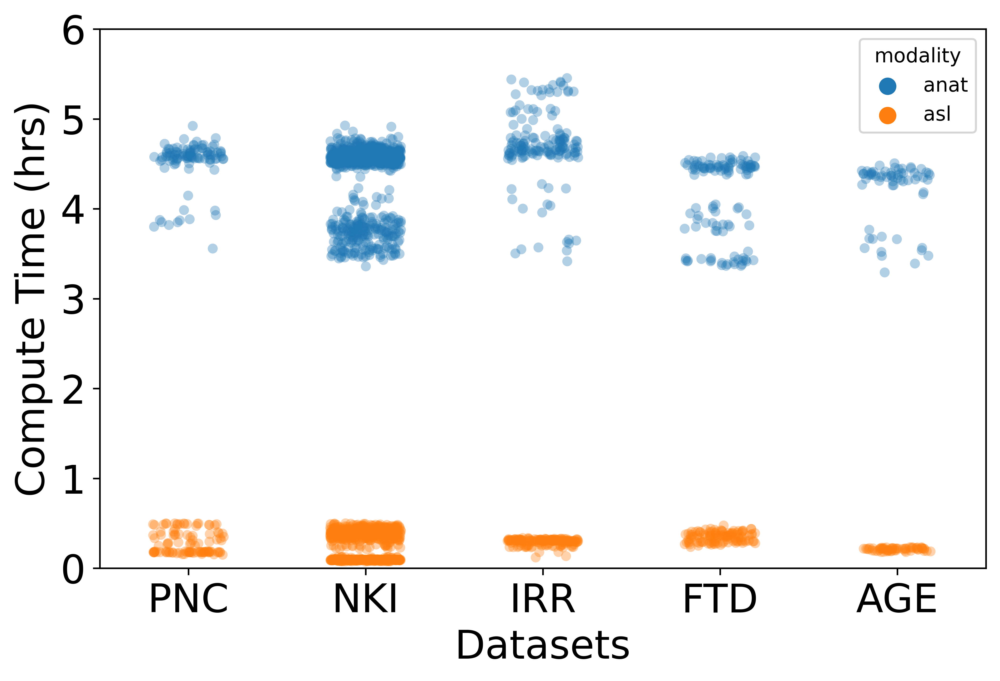

In [12]:
# supfigure 6 
agda=pd.read_csv('scripts/ageingdata/anattime.csv',header=None).to_numpy()/3600
coda=pd.read_csv('scripts/ftddata/anatime.csv',header=None).to_numpy()/3600
grda=pd.read_csv('scripts/grympydata/anattime.csv',header=None).to_numpy()/3600
pnda=pd.read_csv('scripts/pncdata/anattime.csv',header=None).to_numpy()/3600
nkda=pd.read_csv('scripts/nkidata/anattime.csv',header=None).to_numpy()/3600


agdp=pd.read_csv('scripts/ageingdata/perftime.csv',header=None).to_numpy()/3600
codp=pd.read_csv('scripts/ftddata/perftime.csv',header=None).to_numpy()/3600
grdp=pd.read_csv('scripts/grympydata/perftime.csv',header=None).to_numpy()/3600
pndp=pd.read_csv('scripts/pncdata/pertime.csv',header=None).to_numpy()/3600
nkdp=pd.read_csv('scripts/nkidata/perftime.csv',header=None).to_numpy()/3600




agd1=pd.DataFrame(agda);agd2=pd.DataFrame(agdp);
agd=pd.concat([agd1, agd2],axis=1)
agd.columns=['anat','asl']


cod1=pd.DataFrame(coda);cod2=pd.DataFrame(codp);
cod=pd.concat([cod1, cod2],axis=1)
cod.columns=['anat','asl']


grd1=pd.DataFrame(grda);grd2=pd.DataFrame(grdp);
grd=pd.concat([grd1, grd2],axis=1)
grd.columns=['anat','asl']


nkd1=pd.DataFrame(nkda);nkd2=pd.DataFrame(nkdp);
nkd=pd.concat([nkd1, nkd2],axis=1)
nkd.columns=['anat','asl']


pnd1=pd.DataFrame(pnda);pnd2=pd.DataFrame(pndp);
pnd=pd.concat([pnd1, pnd2],axis=1)
pnd.columns=['anat','asl']

agd=agd.dropna(subset=['anat', 'asl'])
nkd=nkd.dropna(subset=['anat', 'asl'])
grd=grd.dropna(subset=['anat', 'asl'])
pnd=pnd.dropna(subset=['anat', 'asl'])
cod=cod.dropna(subset=['anat', 'asl'])


## remove multisession processing and incomplete runs
agd = agd[agd['anat'] > 2] 
cod = cod[cod['anat'] > 2]
grd = grd[grd['anat'] > 2]
pnd = pnd[pnd['anat'] > 2]
nkd = nkd[nkd['anat'] > 2]
agd = agd[agd['asl'] < .5]
cod = cod[cod['asl'] < .5]
grd = grd[grd['asl'] < .5]
grd = grd[grd['asl'] < .5]
pnd = pnd[pnd['asl'] < .5]
nkd = nkd[nkd['asl'] < .5]


agdd1 = pd.DataFrame({'Datasets': np.repeat('AGE',len(agd)),'compute time(hrs)': agd['anat'],'modality':'anat'})
agdd2 = pd.DataFrame({'Datasets': np.repeat('AGE',len(agd)),'compute time(hrs)': agd['asl'],'modality':'asl'})
agdd= pd.concat([agdd1,agdd2])


codd1 = pd.DataFrame({'Datasets': np.repeat('FTD',len(cod)),'compute time(hrs)': cod['anat'],'modality':'anat'})
codd2 = pd.DataFrame({'Datasets': np.repeat('FTD',len(cod)),'compute time(hrs)': cod['asl'],'modality':'asl'})
codd= pd.concat([codd1,codd2])

grdd1 = pd.DataFrame({'Datasets': np.repeat('IRR',len(grd)),'compute time(hrs)': grd['anat'],'modality':'anat'})
grdd2 = pd.DataFrame({'Datasets': np.repeat('IRR',len(grd)),'compute time(hrs)': grd['asl'],'modality':'asl'})
grdd= pd.concat([grdd1,grdd2])

pndd1 = pd.DataFrame({'Datasets': np.repeat('PNC',len(pnd)),'compute time(hrs)': pnd['anat'],'modality':'anat'})
pndd2 = pd.DataFrame({'Datasets': np.repeat('PNC',len(pnd)),'compute time(hrs)': pnd['asl'],'modality':'asl'})
pndd= pd.concat([pndd1,pndd2])

nkdd1 = pd.DataFrame({'Datasets': np.repeat('NKI',len(nkd)),'compute time(hrs)': nkd['anat'],'modality':'anat'})
nkdd2 = pd.DataFrame({'Datasets': np.repeat('NKI',len(nkd)),'compute time(hrs)': nkd['asl'],'modality':'asl'})
nkdd= pd.concat([nkdd1,nkdd2])

comptimed = pd.concat([pndd,nkdd,grdd,codd,agdd])


plt.figure(figsize=(8, 5),dpi=600)
bb = sns.stripplot(x="Datasets", y='compute time(hrs)',hue='modality',data=comptimed,jitter=.2,alpha=.35
                  )

bb.set_xlabel('Datasets',fontsize=20)
bb.set_ylim([0,6])
bb.set_ylabel('Compute Time (hrs)',fontsize=20)
bb.tick_params(labelsize=20)


plt.savefig('sfigure6.png')



In [13]:
# compute time for asl
cpm = comptimed[comptimed['modality']=='asl']
cpm.describe()

,compute time(hrs)
count,1321.000000
mean,0.272897
std,0.134373
min,0.074722
25%,0.097778
50%,0.306389
75%,0.390000
max,0.499722


In [14]:
# compute time for anatomics
cpm = comptimed[comptimed['modality']=='anat']
cpm.describe()

,compute time(hrs)
count,1321.000000
mean,4.408370
std,0.448081
min,3.292222
25%,4.372500
50%,4.550833
75%,4.616389
max,7.168056


In [15]:
gmdatax.to_csv('gmdata.csv',index=False)

In [16]:
1242+1481+154+109+57

3043

In [17]:
1367+1515+163+110+63

3218

In [18]:
gddx

,CBF TYPE,CBF GM,Datasets,CBF,Tissue Type,CBF WM
0,CBF,61.244823,PNC,61.244823,GM,NaN
1,CBF,97.814553,PNC,97.814553,GM,NaN
2,CBF,58.871023,PNC,58.871023,GM,NaN
3,CBF,122.830142,PNC,122.830142,GM,NaN
4,CBF,64.485041,PNC,64.485041,GM,NaN
...,...,...,...,...,...,...
58,PVC,NaN,AGE,33.100681,WM,33.100681
59,PVC,NaN,AGE,71.930451,WM,71.930451
60,PVC,NaN,AGE,44.549038,WM,44.549038
61,PVC,NaN,AGE,50.260484,WM,50.260484


In [19]:
import numpy as np
amt = np.zeros(4)

In [20]:
amt

array([0., 0., 0., 0.])

In [21]:
np.min([3,4,9,1])

1

In [22]:
a= np.array([1,1,4,5])
a

array([1, 1, 4, 5])

In [23]:
amt = np.zeros(len(a))
amt[0] = a[1] - a[0]
amt
for j in range(2,len(amt)):
    print(j)
    amt[j] = np.subtract(a[j],np.min(a[1:(j)]))
amt

2
3


array([0., 0., 3., 4.])

In [24]:
def calculateAmount(prices):
    # Write your code here 
    amt = np.zeros(len(prices))
    amt[1] = prices[1] - prices[0]
    amt[0] = prices[0]
    for j in range(2,len(amt)):
        amt[j] = np.maximum(prices[j] ,np.min(prices[1:j]))
    amt[amt <  0] = 0
    return amt

In [25]:
calculateAmount(a)

array([1., 0., 4., 5.])

In [26]:
def calculateAmount(prices):
    # Write your code here 
    amt = np.zeros(len(prices))
    amt[1] = prices[1] - prices[0]
    amt[0] = prices[0]
    for j in range(2,len(amt)):
        amt[j] = np.subtract(prices[j] ,np.min(prices[1:j]))
    amt[amt <  0] = 0
    #return np.int(sum(amt))
    return amt

In [27]:
aa=[4,4,9,2,3]

In [28]:
calculateAmount(aa)

array([4., 0., 5., 0., 1.])